# Ross Sea synthetic gravity inversion

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import shutil
import logging
import pathlib
import pickle
import verde as vd
import xarray as xr
import pandas as pd
import numpy as np
from polartoolkit import maps, fetch, regions, profiles
from polartoolkit import utils as polar_utils
import string
import copy
from tqdm.autonotebook import tqdm
import os
import RIS_gravity_inversion.synthetic as RIS_synth
import RIS_gravity_inversion.plotting as RIS_plotting
import pygmt
import scipy as sp
import itertools
import matplotlib.pyplot as plt
os.environ['POLARTOOLKIT_HEMISPHERE']='south'

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, plotting, synthetic, uncertainty, utils, regional, cross_validation, optimization

# Get synthetic model data

INFO:root:using preprocessed 5km grid since spacing is > 5km
INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:returning grid with new region and/or registration, same spacing


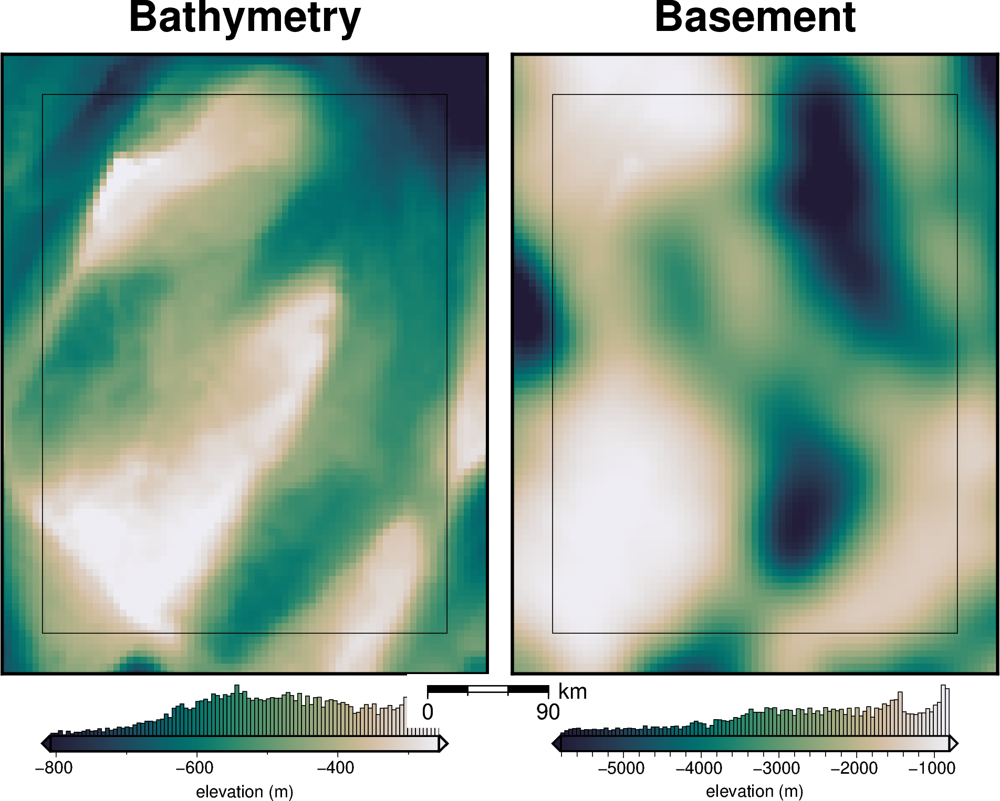

  0%|          | 0/4941 [00:00<?, ?it/s]

  0%|          | 0/4941 [00:00<?, ?it/s]

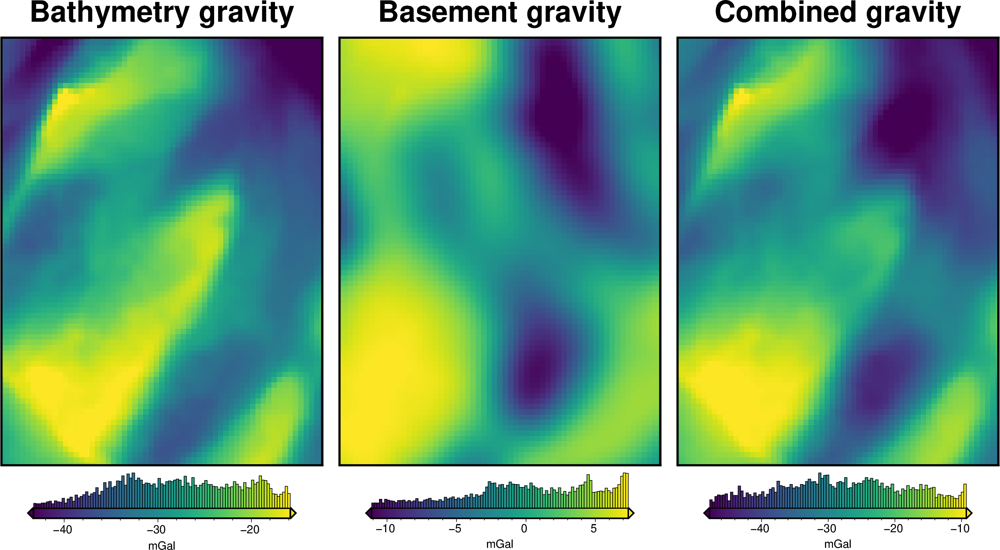

In [2]:
# set grid parameters
spacing = 5e3
inversion_region = (-40e3, 260e3, -1800e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, original_grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    buffer=spacing*6,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [3]:
# normalize regional gravity between 0 and 1
original_grav_df["basement_grav_normalized"] = vd.grid_to_table(utils.normalize_xarray(
    original_grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav,
    low=-1,
    high=1,
)).reset_index().basement_grav
original_grav_df = original_grav_df.drop(columns=["basement_grav", "disturbance", "gravity_anomaly"])
original_grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189
...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265


# Latin hypercube of parameters

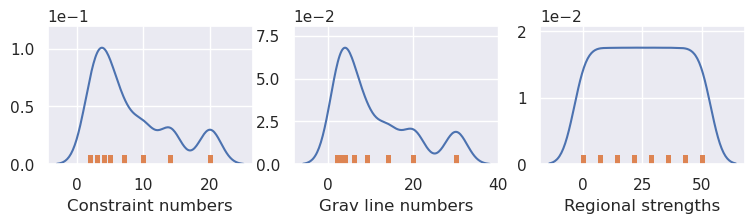

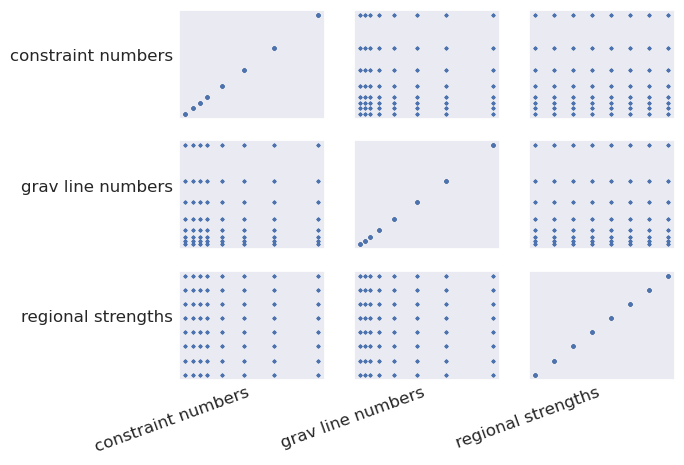

,constraint_numbers,grav_line_numbers,regional_strengths
0,2,2,0.00
1,2,2,7.14
2,2,2,14.29
3,2,2,21.43
4,2,2,28.57
...,...,...,...
507,20,30,21.43
508,20,30,28.57
509,20,30,35.71
510,20,30,42.86


In [85]:
num = 8
log_num = num #+ 1

# Define noise levels for constraints
constraint_noise_levels = [float(round(x,2)) for x in np.linspace(0, 100, log_num)]

# Define noise levels for grav data
grav_noise_levels = [float(round(x,2)) for x in np.linspace(0, 6, num)]

# Define regional strength
regional_strengths = [float(round(x,2)) for x in np.linspace(0, 50, num)]

# Define number of constraints on log scale
constraint_numbers = np.unique(np.round(np.geomspace(2,20,log_num)))
constraint_numbers = [int(i) for i in constraint_numbers]
assert len(constraint_numbers) == num

# Define number of flights lines on log scale
grav_line_numbers = np.unique(np.round(np.geomspace(2,30,num)))
grav_line_numbers = [int(i) for i in grav_line_numbers]
assert len(grav_line_numbers) == num

# turn into dataframe
grid_search_sampled_params_df = pd.DataFrame(
    itertools.product(
        constraint_numbers,
        # constraint_noise_levels,
        grav_line_numbers,
        # grav_noise_levels,
        regional_strengths,
    ),
    columns=[
        "constraint_numbers",
        # "constraint_noise_levels",
        "grav_line_numbers",
        # "grav_noise_levels",
        "regional_strengths",
    ],
)

grid_search_sampled_params = dict(
    constraint_numbers=dict(sampled_values=grid_search_sampled_params_df.constraint_numbers),
    grav_line_numbers=dict(sampled_values=grid_search_sampled_params_df.grav_line_numbers),
    regional_strengths=dict(sampled_values=grid_search_sampled_params_df.regional_strengths),
)

plotting.plot_latin_hypercube(
    grid_search_sampled_params,
    # plot_2d_projections=False,
    # plot_correlations=False,
)

# turn into dataframe
# grid_search_sampled_params_df = pd.DataFrame(
#     [grid_search_sampled_params[x]["sampled_values"] for x in grid_search_sampled_params],
# ).transpose()
# grid_search_sampled_params_df.columns = grid_search_sampled_params.keys()


# grid_search_sampled_params_df = pd.DataFrame(
#     dict(
#         constraint_numbers=constraint_numbers,
#         constraint_noise_levels=constraint_noise_levels,
#         grav_line_numbers=grav_line_numbers,
#         grav_noise_levels=grav_noise_levels,
#         regional_strengths=regional_strengths,
#     ),
# )
grid_search_sampled_params_df

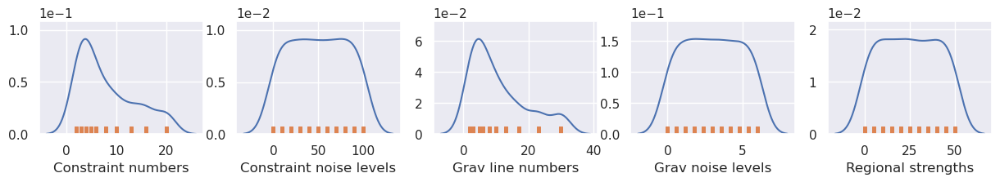

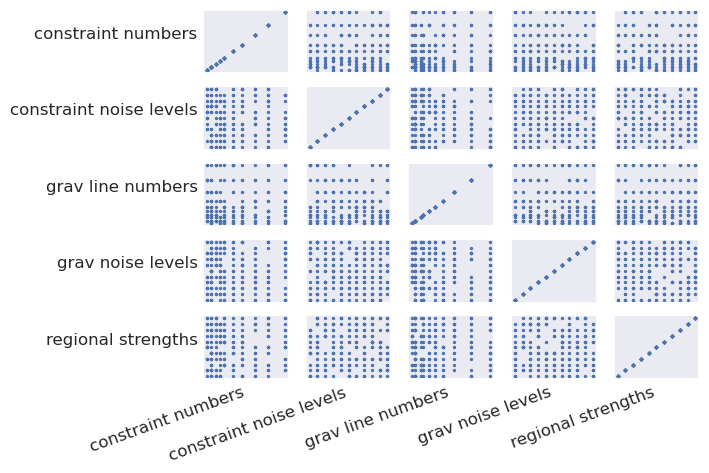

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths
count,200.00000,200.000000,200.000000,200.00000,200.000000
mean,8.17500,50.000000,10.875000,3.00300,24.975000
std,5.67498,31.702131,8.648314,1.90165,15.894577
min,2.00000,0.000000,2.000000,0.00000,0.000000
25%,3.00000,20.000000,3.000000,1.20000,10.000000
50%,6.00000,50.000000,8.000000,3.00000,25.000000
75%,13.00000,80.000000,17.000000,4.80000,40.000000
max,20.00000,100.000000,30.000000,6.00000,50.000000


In [63]:
param_dict = {
    "constraint_numbers": {
        "distribution": "uniform_discrete",
        "loc": 0,
        "scale": 10,
        "norm_limits": [np.log10(2), np.log10(20)],
        "log": True,
        "dtype": int,
    },
    "constraint_noise_levels": {
        "distribution": "uniform_discrete",
        "loc": 0,
        "scale": 10,
        "norm_limits": [0, 100],
    },
    "grav_line_numbers": {
        "distribution": "uniform_discrete",
        "loc": 0,
        "scale": 10,
        "norm_limits": [np.log10(2), np.log10(30)],
        "log": True,
        "dtype": int,
    },
    "grav_noise_levels": {
        "distribution": "uniform_discrete",
        "loc": 0,
        "scale": 10,
        "norm_limits": [0, 6],
    },
    "regional_strengths": {
        "distribution": "uniform_discrete",
        "loc": 0,
        "scale": 10,
        "norm_limits": [0, 50],
    },
}
sampled_params = uncertainty.create_lhc(
    n_samples = 200, ##### CHANGE THIS TO 200
    parameter_dict = param_dict,
    # criterion="centered",
    # criterion="mincorrelation",
    criterion="maximin",
    # criterion="random",
)

plotting.plot_latin_hypercube(
    sampled_params,
    # plot_2d_projections=False,
    # plot_correlations=False,
)

# turn into dataframe
sampled_params_df = pd.DataFrame(
    [sampled_params[x]["sampled_values"] for x in sampled_params],
).transpose()
sampled_params_df.columns = sampled_params.keys()

for k, v in sampled_params.items():
    if v.get("dtype", None) is not None:
        sampled_params_df[k] = sampled_params_df[k].astype(v["dtype"])

sampled_params_df.describe()

In [65]:
[np.sort(sampled_params_df[x].unique()) for x in sampled_params_df.columns]

[array([ 2,  3,  4,  5,  6,  8, 10, 13, 16, 20]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.]),
 array([ 2,  3,  5,  6,  8, 10, 13, 17, 23, 30]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 array([ 0.,  5., 10., 15., 20., 25., 30., 35., 40., 45., 50.])]

In [7]:
# # First test with all combinations of max and min of each 5 parameters (32)
# constraint_numbers = [1, 25]
# constraint_noise_levels = [0, 100]
# grav_line_numbers = [1, 40]
# grav_noise_levels = [0, 6]
# regional_strengths = [0, 50]

# sampled_params_df = pd.DataFrame(
#     itertools.product(
#         constraint_numbers,
#         constraint_noise_levels,
#         grav_line_numbers,
#         grav_noise_levels,
#         regional_strengths,
#     ),
#     columns=[
#         "constraint_numbers",
#         "constraint_noise_levels",
#         "grav_line_numbers",
#         "grav_noise_levels",
#         "regional_strengths",
#     ],
# )
# sampled_params_df

In [8]:
# test gridding starting bathymetry
# constraint_numbers = [1, 5, 25]
# constraint_noise_levels = [0, 40, 100]
# grav_line_numbers = [1]
# grav_noise_levels = [0]
# regional_strengths = [0]

# test creating observed gravity data
# grav_line_numbers = [1, 9, 40]
# regional_strengths = [0]
# constraint_numbers = [25]
# constraint_noise_levels = [0]
# grav_noise_levels = [0]

# test regional grav separation
grav_line_numbers = [2, 30]
regional_strengths = [0, 50]
constraint_numbers = [2, 20]
constraint_noise_levels = [0]
grav_noise_levels = [0, 6]

sampled_params_df = pd.DataFrame(
    itertools.product(
        constraint_numbers,
        constraint_noise_levels,
        grav_line_numbers,
        grav_noise_levels,
        regional_strengths,
    ),
    columns=[
        "constraint_numbers",
        "constraint_noise_levels",
        "grav_line_numbers",
        "grav_noise_levels",
        "regional_strengths",
    ],
)
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths
0,2,0,2,0,0
1,2,0,2,0,50
2,2,0,2,6,0
3,2,0,2,6,50
4,2,0,30,0,0
5,2,0,30,0,50
6,2,0,30,6,0
7,2,0,30,6,50
8,20,0,2,0,0
9,20,0,2,0,50


# Set filename

In [9]:
ensemble_path = f"../../results/08_ensemble_testing_combinations"
ensemble_fname = f"{ensemble_path}.csv"

# Save and reload dataframe

In [10]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [11]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df#.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths
0,2,0,2,0,0
1,2,0,2,0,50
2,2,0,2,6,0
3,2,0,2,6,50
4,2,0,30,0,0
5,2,0,30,0,50
6,2,0,30,6,0
7,2,0,30,6,50
8,20,0,2,0,0
9,20,0,2,0,50


# Create starting models and constraints
Only need to do this for unique combinations of constraint_numbers and constraint_noise_levels

In [12]:
sampled_params_df["constraint_points_fname"] = pd.Series()
sampled_params_df["constraints_starting_rmse"] = pd.Series()
sampled_params_df["starting_bathymetry_fname"] = pd.Series()
sampled_params_df["starting_bathymetry_rmse"] = pd.Series()
sampled_params_df["constraint_spacing"] = pd.Series()
sampled_params_df["starting_prisms_fname"] = pd.Series()
sampled_params_df["starting_bathymetry_damping"] = pd.Series()

dampings=np.logspace(-20, 1, 8).tolist() ##### CHANGE THIS TO 8
# dampings.append(None)
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    dampings=dampings,
)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names
    constraint_points_fname = f"{ensemble_path}constraint_points_{i}.csv"
    starting_bathymetry_fname = f"{ensemble_path}starting_bathymetry_{i}.nc"
    starting_prisms_fname = f"{ensemble_path}starting_prisms_{i}.nc"

    # check if combo of constraint spacing and noise is already done
    # if so, copy it
    subset_with_same_params = sampled_params_df[
        (sampled_params_df.constraint_numbers == row.constraint_numbers) &
        (sampled_params_df.constraint_noise_levels == row.constraint_noise_levels)]

    if (len(subset_with_same_params) > 1) & (subset_with_same_params.constraint_points_fname.iloc[0] is not np.nan):
        # copy and rename files
        shutil.copy(subset_with_same_params.constraint_points_fname.iloc[0], constraint_points_fname)
        shutil.copy(subset_with_same_params.starting_bathymetry_fname.iloc[0], starting_bathymetry_fname)
        shutil.copy(subset_with_same_params.starting_prisms_fname.iloc[0], starting_prisms_fname)

        # copy other columns
        sampled_params_df.loc[i, "constraints_starting_rmse"] = subset_with_same_params.constraints_starting_rmse.iloc[0]
        sampled_params_df.loc[i, "starting_bathymetry_rmse"] = subset_with_same_params.starting_bathymetry_rmse.iloc[0]
        sampled_params_df.loc[i, "constraint_spacing"] = subset_with_same_params.constraint_spacing.iloc[0]
        sampled_params_df.loc[i, "starting_bathymetry_damping"] = subset_with_same_params.starting_bathymetry_damping.iloc[0]

        print("skipping and using already create data")
    else:
        # make constraint points
        constraint_points = RIS_synth.constraint_layout_number(
            shape=(row.constraint_numbers, row.constraint_numbers),
            region=inversion_region,
            padding=-spacing,
        )

        # calculate constraint spatial density
        x_spacing=(inversion_region[1]-inversion_region[0])/row.constraint_numbers
        y_spacing=(inversion_region[3]-inversion_region[2])/row.constraint_numbers
        constraint_spacing = ((x_spacing + y_spacing)/2)/1e3

        # sample true topography at these points
        constraint_points = utils.sample_grids(
            constraint_points,
            bathymetry,
            "true_upward",
            coord_names=("easting", "northing"),
        )
        constraint_points["upward"] = constraint_points.true_upward

        # re-sample depths with uncertainty to emulate measurement errors
        constraint_points.loc[constraint_points.index, "true_uncert"] = row.constraint_noise_levels
        constraint_points = uncertainty.randomly_sample_data(
            seed=0,
            data_df=constraint_points,
            data_col="upward",
            uncert_col="true_uncert",
        )

        # create weights column
        constraint_points["weight"] = 1 / (constraint_points.true_uncert**2)

        # grid the sampled values using verde
        starting_bathymetry = utils.create_topography(
            constraints_df=constraint_points,
            **starting_topography_kwargs,
        )
        try:
            starting_bathymetry.attrs["damping"] = str(starting_bathymetry.attrs["damping"])
        except KeyError:
            starting_bathymetry.attrs["damping"] = "None"

        starting_bathymetry_rmse = utils.rmse(bathymetry - starting_bathymetry)

        # sample the inverted topography at the constraint points
        constraint_points = utils.sample_grids(
            constraint_points,
            starting_bathymetry,
            "starting_bathymetry",
            coord_names=("easting", "northing"),
        )

        rmse = utils.rmse(constraint_points.true_upward - constraint_points.starting_bathymetry)

        zref = 0
        # the true density contrast is 1476 kg/m3
        density_contrast = 1350

        # make density grid
        density_grid = xr.where(
            starting_bathymetry >=  zref,
            density_contrast,
            -density_contrast,
        )

        # create layer of prisms
        starting_prisms = utils.grids_to_prisms(
            starting_bathymetry,
            zref,
            density=density_grid,
        )

        sampled_params_df.loc[i, "constraints_starting_rmse"] = rmse
        sampled_params_df.loc[i, "starting_bathymetry_rmse"] = starting_bathymetry_rmse
        sampled_params_df.loc[i, "constraint_spacing"] = constraint_spacing
        sampled_params_df.loc[i, "starting_bathymetry_damping"] = starting_bathymetry.attrs["damping"]

        # save to files
        constraint_points.to_csv(constraint_points_fname, index=False)
        starting_bathymetry.to_netcdf(starting_bathymetry_fname)
        starting_prisms.to_netcdf(starting_prisms_fname)

    # add to dataframe
    sampled_params_df.loc[i, "constraint_points_fname"] = constraint_points_fname
    sampled_params_df.loc[i, "starting_bathymetry_fname"] = starting_bathymetry_fname
    sampled_params_df.loc[i, "starting_prisms_fname"] = starting_prisms_fname

sampled_params_df

  0%|          | 0/16 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.
INFO:invert4geom:Best SplineCV score: nan
INFO:invert4geom:Best damping: 1e-20


skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data


INFO:invert4geom:Best SplineCV score: 0.9616291739023437
INFO:invert4geom:Best damping: 1e-08


skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data


,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1e-20
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1e-20
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1e-20
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1e-20
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1e-20
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,../../results/starting_prisms_5.nc,1e-20
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,../../results/starting_prisms_6.nc,1e-20
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,../../results/starting_prisms_7.nc,1e-20
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,../../results/starting_prisms_8.nc,1e-08
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,../../results/starting_prisms_9.nc,1e-08


In [13]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [14]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20


In [15]:
# lims = polar_utils.get_min_max(bathymetry)

# for i, row in sampled_params_df.iterrows():
#     starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
#     constraint_points = pd.read_csv(row.constraint_points_fname)

#     starting_bathymetry_inside = starting_bathymetry.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )
#     bathymetry_inside = bathymetry.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )

#     # compare starting and actual bathymetry grids
#     fig = maps.plot_grd(
#         bathymetry_inside,
#         fig_height=10,
#         cmap="rain",
#         reverse_cpt=True,
#         cpt_lims=lims,
#         title=f"True bathymetry",
#         cbar_label="elevation (m)",
#         cbar_font="18p,Helvetica,black",
#         frame=["nSWe", "xaf10000", "yaf10000"],
#         hist=True,
#         cbar_yoffset=1.5,
#         points=constraint_points,
#         points_style="x.2c",
#     )

#     dif = (bathymetry_inside - starting_bathymetry_inside)
#     fig = maps.plot_grd(
#         dif,
#         fig_height=10,
#         cmap="balance+h0",
#         cpt_lims=(-vd.maxabs(dif), vd.maxabs(dif)),
#         title="difference",
#         cbar_label=f"RMSE: {round(utils.rmse(dif),1)} (m)",
#         cbar_font="18p,Helvetica,black",
#         hist=True,
#         cbar_yoffset=1.5,
#         grd2_cpt=True,
#         fig=fig,
#         origin_shift="xshift",
#         xshift_amount=1.1,
#         points=constraint_points,
#         points_style="x.2c",
#     )

#     # plot the starting bathymetry
#     fig = maps.plot_grd(
#         starting_bathymetry_inside,
#         fig_height=10,
#         cmap="rain",
#         reverse_cpt=True,
#         cpt_lims=lims,
#         title=f"spacing: {round(row.constraint_spacing)} km, noise: {round(row.constraint_noise_levels,1)} m",
#         cbar_label="Starting bathymetry (m)",
#         cbar_font="18p,Helvetica,black",
#         frame=["nSwe", "xaf10000", "yaf10000"],
#         hist=True,
#         cbar_yoffset=1.5,
#         fig=fig,
#         origin_shift="xshift",
#         xshift_amount=1.1,
#         points=constraint_points,
#         points_style="x.2c",
#     )
#     fig.show()

# Create observed gravity
* rescale regional field 
* sample full-res gravity along flight lines
* grid flight line data with equivalent sources

Only need to do this for unique combinations of grav_line_numbers and regional_strengths 

In [16]:
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,../../results/starting_prisms_5.nc,1.000000e-20
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,../../results/starting_prisms_6.nc,1.000000e-20
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,../../results/starting_prisms_7.nc,1.000000e-20
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,../../results/starting_prisms_8.nc,1.000000e-08
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,../../results/starting_prisms_9.nc,1.000000e-08


In [ ]:
logging.getLogger().setLevel(logging.WARNING)

sampled_params_df["grav_df_fname"] = pd.Series()
sampled_params_df["grav_survey_df_fname"] = pd.Series()
sampled_params_df["grav_line_spacing"] = pd.Series()
sampled_params_df["grav_eqs_damping"] = pd.Series()
sampled_params_df["grav_eqs_depth"] = pd.Series()
sampled_params_df["grav_eqs_score"] = pd.Series()

grav_grid = original_grav_df.set_index(['northing', 'easting']).to_xarray()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names
    grav_df_fname = f"{ensemble_path}grav_df_{i}.csv"
    grav_survey_df_fname = f"{ensemble_path}grav_survey_df_{i}.csv"

    # check if combo of grav_line_numbers and regional_strengths is already done
    # if so, copy it
    subset_with_same_params = sampled_params_df[
        (sampled_params_df.grav_line_numbers == row.grav_line_numbers) &
        (sampled_params_df.regional_strengths == row.regional_strengths)]

    if (len(subset_with_same_params) > 1) & (subset_with_same_params.grav_df_fname.iloc[0] is not np.nan):
        # copy and rename files
        shutil.copy(subset_with_same_params.grav_df_fname.iloc[0], grav_df_fname)
        shutil.copy(subset_with_same_params.grav_survey_df_fname.iloc[0], grav_survey_df_fname)

        # copy other columns
        sampled_params_df.loc[i, "grav_line_spacing"] = subset_with_same_params.grav_line_spacing.iloc[0]
        sampled_params_df.loc[i, "grav_eqs_damping"] = subset_with_same_params.grav_eqs_damping.iloc[0]
        sampled_params_df.loc[i, "grav_eqs_depth"] = subset_with_same_params.grav_eqs_depth.iloc[0]
        sampled_params_df.loc[i, "grav_eqs_score"] = subset_with_same_params.grav_eqs_score.iloc[0]
        print("skipping and using already create data")
    else:
        # re-scale the regional gravity
        regional_grav = utils.normalize_xarray(
            grav_grid.basement_grav_normalized,
            low=0,
            high=row.regional_strengths,
        ).rename("basement_grav")
        regional_grav -= regional_grav.mean()

        # add to new dataframe
        grav_df = copy.deepcopy(original_grav_df.drop(columns=["basement_grav_normalized"]))
        grav_df["basement_grav"] = vd.grid_to_table(regional_grav).reset_index().basement_grav

        # add basement and bathymetry forward gravities together to make observed gravity
        grav_df["gravity_anomaly_full_res_no_noise"] = grav_df.bathymetry_grav + grav_df.basement_grav

        # create flight lines
        grav_survey_df = RIS_synth.airborne_survey(
            along_line_spacing=1e3, ##### CHANGE THIS TO 1e3
            grav_observation_height=1e3,
            NS_line_number=row.grav_line_numbers,
            EW_line_number=row.grav_line_numbers,
            region=inversion_region,
            grav_grid=grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly_full_res_no_noise,
            # plot=True,
        )
        grav_survey_df=grav_survey_df.rename(columns={"gravity_anomaly": "gravity_anomaly_no_noise"})
        x_spacing=(inversion_region[1]-inversion_region[0])/row.grav_line_numbers
        y_spacing=(inversion_region[3]-inversion_region[2])/row.grav_line_numbers
        grav_line_spacing = ((x_spacing + y_spacing)/2)/1e3

        # grid the airborne survey data with equivalent sources
        eqs_study, eqs = optimization.optimize_eq_source_params(
            (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward),
            grav_survey_df.gravity_anomaly_no_noise,
            n_trials=8, ##### CHANGE THIS TO 8
            damping_limits=[1e-20, 1e-2],
            depth_limits=[100, 100e3],
            block_size=spacing*2,
            # plot=True,
            progressbar=False,
            fname=f"../../results/08_eqs.pkl",
        )
        #predict sources onto grid
        grav_df["eqs_gravity_anomaly"] = eqs.predict(
            (
                grav_df.easting,
                grav_df.northing,
                grav_df.upward,
            ),
        )
        grav_df["gravity_anomaly_no_noise"] = grav_df.eqs_gravity_anomaly

        # add to dataframe
        sampled_params_df.loc[i, "grav_line_spacing"] = grav_line_spacing
        sampled_params_df.loc[i, "grav_eqs_damping"] = eqs_study.best_trial.params["damping"]
        sampled_params_df.loc[i, "grav_eqs_depth"] = eqs_study.best_trial.params["depth"]
        sampled_params_df.loc[i, "grav_eqs_score"] = eqs_study.best_trial.value

        # save to files
        grav_survey_df.to_csv(grav_survey_df_fname, index=False)
        grav_df.to_csv(grav_df_fname, index=False)

    # add to dataframe
    sampled_params_df.loc[i, "grav_df_fname"] = grav_df_fname
    sampled_params_df.loc[i, "grav_survey_df_fname"] = grav_survey_df_fname

sampled_params_df.head()

  0%|          | 0/16 [00:00<?, ?it/s]

skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data
skipping and using already create data


,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.0,0.0,35154.896529,0.999855
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.0,0.0,35154.896529,0.999978
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.0,0.0,35154.896529,0.999855
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.0,0.0,35154.896529,0.999978
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,0.0,35154.896529,0.999765


In [18]:
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.0,0.0,35154.896529,0.999855
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.0,0.0,35154.896529,0.999978
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.0,0.0,35154.896529,0.999855
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.0,0.0,35154.896529,0.999978
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,0.0,35154.896529,0.999765
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,../../results/starting_prisms_5.nc,1.000000e-20,../../results/grav_df_5.csv,../../results/grav_survey_df_5.csv,11.666667,0.0,35154.896529,0.999947
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,../../results/starting_prisms_6.nc,1.000000e-20,../../results/grav_df_6.csv,../../results/grav_survey_df_6.csv,11.666667,0.0,35154.896529,0.999765
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,../../results/starting_prisms_7.nc,1.000000e-20,../../results/grav_df_7.csv,../../results/grav_survey_df_7.csv,11.666667,0.0,35154.896529,0.999947
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,../../results/starting_prisms_8.nc,1.000000e-08,../../results/grav_df_8.csv,../../results/grav_survey_df_8.csv,175.0,0.0,35154.896529,0.999855
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,../../results/starting_prisms_9.nc,1.000000e-08,../../results/grav_df_9.csv,../../results/grav_survey_df_9.csv,175.0,0.0,35154.896529,0.999978


In [19]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [20]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765


# Add noise to gravity data

In [21]:
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    grav_df = pd.read_csv(row.grav_df_fname)

    # contaminated with long-wavelength noise
    contaminated = synthetic.contaminate_with_long_wavelength_noise(
        grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly_no_noise,
        coarsen_factor=None,
        spacing=50e3,
        noise_as_percent=False,
        noise=row.grav_noise_levels,
    )
    contaminated_df = vd.grid_to_table(contaminated.rename("gravity_anomaly_no_noise")).reset_index(drop=True)

    grav_df = pd.merge(
        grav_df.drop(columns=["gravity_anomaly_no_noise"], errors="ignore"),
        contaminated_df,
        on=["easting", "northing"],
    )

    # contaminate gravity with random noise
    grav_df["gravity_anomaly"], stddev = synthetic.contaminate(
        grav_df.gravity_anomaly_no_noise,
        stddev=row.grav_noise_levels,
        percent=False,
        seed=0
    )

    # add noise level to uncert column
    grav_df["uncert"] = row.grav_noise_levels

    # resave gravity dataframe
    grav_df.to_csv(row.grav_df_fname, index=False)

sampled_params_df.head()

  0%|          | 0/16 [00:00<?, ?it/s]

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765


In [88]:
sampled_params_df.to_csv(ensemble_fname, index=False)

NameError: name 'ensemble_fname' is not defined

In [23]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,starting_prisms_fname,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,../../results/starting_prisms_0.nc,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,../../results/starting_prisms_1.nc,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,../../results/starting_prisms_2.nc,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,../../results/starting_prisms_3.nc,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,../../results/starting_prisms_4.nc,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765


In [24]:
# for i, row in sampled_params_df.iterrows():
#     grav_survey_df = pd.read_csv(row.grav_survey_df_fname)
#     grav_df = pd.read_csv(row.grav_df_fname)

#     grav_grid = grav_df.set_index(['northing', 'easting']).to_xarray()

#     # plot the synthetic gravity anomaly grid
#     lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

#     fig = maps.plot_grd(
#         grav_grid.gravity_anomaly_full_res_no_noise,
#         fig_height=10,
#         cmap="viridis",
#         cpt_lims=lims,
#         title=f"regional strength: {int(row.regional_strengths)} mGal",
#         cbar_label="Full resolution gravity (mGal)",
#         cbar_font="18p,Helvetica,black",
#         frame=["nSWe", "xaf10000", "yaf10000"],
#         hist=True,
#         cbar_yoffset=1.5,
#     )
#     # plot observation points
#     fig.plot(
#         grav_survey_df[["easting", "northing"]],
#         style="c.02c",
#         fill="black",
#     )
#     dif = (
#         grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
#     )
#     fig = maps.plot_grd(
#         dif,
#         fig_height=10,
#         cmap="balance+h0",
#         cpt_lims=(-vd.maxabs(dif), vd.maxabs(dif)),
#         title="difference",
#         cbar_label=f"RMSE: {round(utils.rmse(dif),2)} (mGal)",
#         cbar_font="18p,Helvetica,black",
#         hist=True,
#         cbar_yoffset=1.5,
#         grd2_cpt=True,
#         fig=fig,
#         origin_shift="xshift",
#         xshift_amount=1.1,
#     )
#     # plot the synthetic observed gravity grid
#     fig = maps.plot_grd(
#         grav_grid.gravity_anomaly,
#         fig_height=10,
#         cmap="viridis",
#         cpt_lims=lims,
#         title=f"line spacing: {round(row.grav_line_spacing)} km, noise: {round(row.grav_noise_levels,1)} mGal",
#         cbar_label="Sampled and gridded (mGal)",
#         cbar_font="18p,Helvetica,black",
#         frame=["nSwe", "xaf10000", "yaf10000"],
#         hist=True,
#         cbar_yoffset=1.5,
#         fig=fig,
#         origin_shift="xshift",
#         xshift_amount=1.1,
#     )
#     fig.show()

# Calculate starting gravity and misfit

In [25]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )

In [26]:
logging.getLogger().setLevel(logging.WARNING)

sampled_params_df["reg_eqs_damping"] = pd.Series()
sampled_params_df["reg_eqs_depth"] = pd.Series()
sampled_params_df["reg_eqs_score"] = pd.Series()

# estimate regional
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    cv=True,
    cv_kwargs=dict(
        n_trials=50, # CHANGE TO 50
        damping_limits=(1e-30, 10),
        depth_limits=(100, 1000e3),
        progressbar=False,
        fname=f"tmp/08_regional_sep",
    ),
    # damping=None, # CHANGE TO LIMITS
    block_size=None,
)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate the starting gravity
    grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
        coordinates=(
            grav_df.easting,
            grav_df.northing,
            grav_df.upward,
        ),
        field="g_z",
        progressbar=False,
    )

    # calculate the true residual misfit
    grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

    # temporarily set some kwargs
    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points
    temp_reg_kwargs["cv_kwargs"]["fname"] = f"tmp/08_regional_sep_{i}"
    # temp_reg_kwargs["cv_kwargs"]["plot"]=True
    # temp_reg_kwargs["cv_kwargs"]["progressbar"]=True

    grav_df = regional.regional_separation(
        grav_df=grav_df,
        **temp_reg_kwargs,
    )
    # regional_comparison(grav_df)

    # re-load the study from the saved pickle file
    with pathlib.Path(f"tmp/08_regional_sep_{i}.pickle").open("rb") as f:
        reg_study = pickle.load(f)
    reg_eq_damping = min(reg_study.best_trials, key=lambda t: t.values[0]).params["damping"]
    reg_eq_depth = min(reg_study.best_trials, key=lambda t: t.values[0]).params["depth"]
    reg_score = reg_study.best_trial.value

    # add to dataframe
    sampled_params_df.loc[i, "reg_eqs_damping"] = reg_eq_damping
    sampled_params_df.loc[i, "reg_eqs_depth"] = reg_eq_depth
    sampled_params_df.loc[i, "reg_eqs_score"] = reg_score

    # resave gravity dataframe
    grav_df.to_csv(row.grav_df_fname, index=False)

sampled_params_df.head()

  0%|          | 0/16 [00:00<?, ?it/s]

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855,0.0,510617.021226,-1.145871
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978,0.0,438255.269833,-0.282534
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855,0.000005,577863.239096,0.254514
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978,0.0,655876.775449,0.514557
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765,0.0,438255.269833,-1.077296


In [27]:
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855,0.0,510617.021226,-1.145871
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978,0.0,438255.269833,-0.282534
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855,0.000005,577863.239096,0.254514
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978,0.0,655876.775449,0.514557
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765,0.0,438255.269833,-1.077296
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_5.csv,../../results/grav_survey_df_5.csv,11.666667,2.719541e-13,35154.896529,0.999947,0.0,438255.269833,-0.282502
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_6.csv,../../results/grav_survey_df_6.csv,11.666667,2.719541e-13,35154.896529,0.999765,0.000001,576570.969772,0.232784
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_7.csv,../../results/grav_survey_df_7.csv,11.666667,2.719541e-13,35154.896529,0.999947,0.0,655876.775449,0.516204
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,...,1.000000e-08,../../results/grav_df_8.csv,../../results/grav_survey_df_8.csv,175.000000,2.719541e-13,35154.896529,0.999855,0.0,331874.532252,0.950641
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,...,1.000000e-08,../../results/grav_df_9.csv,../../results/grav_survey_df_9.csv,175.000000,2.719541e-13,35154.896529,0.999978,0.0,29758.674369,0.99624


In [28]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [30]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,starting_bathymetry_damping,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855,6.308362e-16,510617.021226,-1.145871
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978,2.221972e-22,438255.269833,-0.282534
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855,4.617304e-06,577863.239096,0.254514
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978,1.307017e-30,655876.775449,0.514557
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,1.000000e-20,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765,2.221972e-22,438255.269833,-1.077296


# Damping Cross Validation

In [33]:
logging.getLogger().setLevel(logging.WARNING)

sampled_params_df["damping_cv_results_fname"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):

    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)

    l2_norm_tolerance = np.sqrt(row.grav_noise_levels)

    if row.grav_noise_levels == 0:
        l2_norm_tolerance = .5
    else:
        l2_norm_tolerance = row.grav_noise_levels

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200, #### CHANGE THIS TO 200
        "l2_norm_tolerance": l2_norm_tolerance, # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
    }

    # set results file name
    damping_cv_results_fname = f"{ensemble_path}_damping_cv_{i}"

    # run the inversion workflow, including a cross validation for the damping parameter
    _ = inversion.run_inversion_workflow(
        grav_df=grav_df,
        starting_prisms=starting_prisms,
        # for creating test/train splits
        grav_spacing=spacing,
        inversion_region=inversion_region,
        run_damping_cv=True,
        damping_limits=(0.001, 0.1),
        damping_cv_trials=8, ### CHANGE THIS TO 8
        # plot_cv=True,
        fname=damping_cv_results_fname,
        **kwargs,
    )

    # add results file name
    sampled_params_df.loc[i, "damping_cv_results_fname"] = damping_cv_results_fname

sampled_params_df.head()

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4


In [34]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [35]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_df_fname,grav_survey_df_fname,grav_line_spacing,grav_eqs_damping,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,../../results/grav_df_0.csv,../../results/grav_survey_df_0.csv,175.000000,2.719541e-13,35154.896529,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,../../results/grav_df_1.csv,../../results/grav_survey_df_1.csv,175.000000,2.719541e-13,35154.896529,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,../../results/grav_df_2.csv,../../results/grav_survey_df_2.csv,175.000000,2.719541e-13,35154.896529,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,../../results/grav_df_3.csv,../../results/grav_survey_df_3.csv,175.000000,2.719541e-13,35154.896529,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,../../results/grav_df_4.csv,../../results/grav_survey_df_4.csv,11.666667,2.719541e-13,35154.896529,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4


In [38]:
sampled_params_df["best_damping"] = pd.Series()
sampled_params_df["constraints_damping_cv_rmse"] = pd.Series()
sampled_params_df["inversion_damping_cv_rmse"] = pd.Series()

for i, row in sampled_params_df.iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.damping_cv_results_fname}_results.pickle").open("rb") as f:
        results = pickle.load(f)

    # load study
    with pathlib.Path(f"{row.damping_cv_results_fname}_damping_cv_study.pickle").open("rb") as f:
        study = pickle.load(f)

    # collect the results
    topo_results, grav_results, parameters, elapsed_time = results

    # add best damping to dataframe
    sampled_params_df.loc[i, "best_damping"] = parameters.get("Solver damping")

    # plotting.plot_convergence(
    #     grav_results,
    #     params=parameters,
    # )

    # plotting.plot_cv_scores(
    #         study.trials_dataframe().value.values,
    #         study.trials_dataframe().params_damping.values,
    #         param_name="Damping",
    #         logx=True,
    #         logy=True,
    #     )

    # plotting.plot_inversion_results(
    #     grav_results,
    #     topo_results,
    #     parameters,
    #     inversion_region,
    #     iters_to_plot=2,
    #     # plot_iter_results=False,
    #     plot_topo_results=False,
    #     plot_grav_results=False,
    # )

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # _ = polar_utils.grd_compare(
    #     bathymetry,
    #     final_bathymetry,
    #     region=inversion_region,
    #     plot=True,
    #     grid1_name="True topography",
    #     grid2_name="Inverted topography",
    #     robust=True,
    #     hist=True,
    #     inset=False,
    #     verbose="q",
    #     title="difference",
    #     grounding_line=False,
    #     reverse_cpt=True,
    #     cmap="rain",
    #     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    #     points_style="x.2c",
    # )

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        "inverted_damping_cv_bathymetry",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_damping_cv_bathymetry)
    bathymetry_inner = bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    final_bathymetry_inner = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    inversion_rmse = utils.rmse(bathymetry_inner - final_bathymetry_inner)

    # save final topography to file
    inverted_bathymetry_fname = f"{ensemble_path}inverted_damping_cv_bathymetry_{i}.nc"
    final_bathymetry.to_netcdf(inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "inverted_damping_cv_bathymetry_fname"] = inverted_bathymetry_fname
    sampled_params_df.loc[i, "constraints_damping_cv_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "inversion_damping_cv_rmse"] = inversion_rmse

sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,35154.896529,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.74249,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,35154.896529,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,35154.896529,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,35154.896529,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,35154.896529,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc


In [39]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [40]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_eqs_depth,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,35154.896529,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,35154.896529,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,35154.896529,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,35154.896529,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,35154.896529,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc


## Density CV

In [42]:
sampled_params_df["density_cv_results_fname"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # temporarily set some regional kwargs
    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points
    # temp_reg_kwargs["cv_kwargs"]["fname"] = f"tmp/08_regional_sep_{i}"

    density_cv_results_fname = f"{ensemble_path}_density_cv_{i}"

    l2_norm_tolerance = np.sqrt(row.grav_noise_levels)

    if row.grav_noise_levels == 0:
        l2_norm_tolerance = .5
    else:
        l2_norm_tolerance = row.grav_noise_levels

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200, #### CHANGE THIS TO 200
        "l2_norm_tolerance": l2_norm_tolerance, # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
    }

    # if only 1 constraint, cant use k-folds approach
    if len(constraint_points) == 1:
        starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
        # run with alternative regional removal
        study, inversion_results = optimization.optimize_inversion_zref_density_contrast(
            grav_df=grav_df,
            solver_damping=row.best_damping,
            constraints_df=constraint_points,
            density_contrast_limits=(1300, 1600),
            zref=0,
            n_trials=8, # CHANGE THIS TO 10
            starting_topography=starting_bathymetry,
            regional_grav_kwargs=dict(
                method="constant",
                constraints_df=constraint_points,
            ),
            fname=density_cv_results_fname,
            **kwargs,
        )

        # re-run using the above density contrast
        inversion_results = inversion.run_inversion_workflow(
            grav_df=grav_df,
            solver_damping=row.best_damping,
            zref=0,
            density_contrast=study.best_params["density_contrast"],
            create_starting_prisms=True,
            starting_topography=starting_bathymetry,
            calculate_regional_misfit=True,
            plot_dynamic_convergence=False,
            regional_grav_kwargs=temp_reg_kwargs,  # constraint point minimization
            **kwargs,
        )
    else:
        # run a 5-fold cross validation for 8 parameter sets of density
        # this performs 40 regional separations and 40 inversions
        study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
            grav_df=grav_df,
            solver_damping=row.best_damping,
            constraints_df=constraint_points,
            density_contrast_limits=(1300, 1600),
            zref=0,
            n_trials=8, # CHANGE THIS TO 10
            split_kwargs=dict(
                n_splits=5, # CHANGE THIS TO 5
                method="KFold",
            ),
            regional_grav_kwargs=temp_reg_kwargs,
            starting_topography_kwargs=starting_topography_kwargs,
            fname=density_cv_results_fname,
            fold_progressbar=False,
            plot_cv=False,
            **kwargs,
        )

    # add results file name
    sampled_params_df.loc[i, "density_cv_results_fname"] = density_cv_results_fname

sampled_params_df.head()

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 19:40:51,858] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:51,861] Trial 0 failed with value nan.
[W 2024-10-17 19:40:51,881] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:51,883] Trial 1 failed with value nan.
[W 2024-10-17 19:40:51,957] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:51,958] Trial 2 failed with value nan.
[W 2024-10-17 19:40:51,977] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:51,978] Trial 3 failed with value nan.
[W 2024-10-17 19:40:52,022] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 19:40:52,689] Trial 43 failed with value nan.
[W 2024-10-17 19:40:52,740] Trial 44 failed with parameters: {'depth': 300941.22180981317, 'damping': 6.129051118686785e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:52,740] Trial 44 failed with value nan.
[W 2024-10-17 19:40:52,770] Trial 45 failed with parameters: {'depth': 303132.25439496967, 'damping': 3.1941266882293615e-23} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:52,771] Trial 45 failed with value nan.
[W 2024-10-17 19:40:52,799] Trial 46 failed with parameters: {'depth': 557622.430843778, 'damping': 3.394045159529352e-13} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:40:52,800] Trial 46 failed with value nan.
[W 2024-10-17 19:40:52,823] Trial 47 failed with parameters: {'depth': 475184.7341903091, 'damping': 1.1932659962251074e-21} because of the following error: The value nan is not acceptable.
[

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 19:52:15,108] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,109] Trial 0 failed with value nan.
[W 2024-10-17 19:52:15,121] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,122] Trial 1 failed with value nan.
[W 2024-10-17 19:52:15,140] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,141] Trial 2 failed with value nan.
[W 2024-10-17 19:52:15,158] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,159] Trial 3 failed with value nan.
[W 2024-10-17 19:52:15,169] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 19:52:15,520] Trial 34 failed with value nan.
[W 2024-10-17 19:52:15,531] Trial 35 failed with parameters: {'depth': 79705.12884694859, 'damping': 2.9461677323301302e-21} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,532] Trial 35 failed with value nan.
[W 2024-10-17 19:52:15,544] Trial 36 failed with parameters: {'depth': 330786.2400509338, 'damping': 9.744042791665433e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,544] Trial 36 failed with value nan.
[W 2024-10-17 19:52:15,556] Trial 37 failed with parameters: {'depth': 40055.21276910827, 'damping': 2.06185220427892e-17} because of the following error: The value nan is not acceptable.
[W 2024-10-17 19:52:15,556] Trial 37 failed with value nan.
[W 2024-10-17 19:52:15,568] Trial 38 failed with parameters: {'depth': 314995.37915550405, 'damping': 5.3854926200205574e-11} because of the following error: The value nan is not acceptable.
[W

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 20:24:07,730] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:07,731] Trial 0 failed with value nan.
[W 2024-10-17 20:24:07,746] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:07,747] Trial 1 failed with value nan.
[W 2024-10-17 20:24:07,761] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:07,761] Trial 2 failed with value nan.
[W 2024-10-17 20:24:07,775] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:07,776] Trial 3 failed with value nan.
[W 2024-10-17 20:24:07,788] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 20:24:08,147] Trial 33 failed with parameters: {'depth': 534604.4930069349, 'damping': 1.9780727154485344e-12} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:08,147] Trial 33 failed with value nan.
[W 2024-10-17 20:24:08,159] Trial 34 failed with parameters: {'depth': 39377.839048664806, 'damping': 1.1820463809839602e-19} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:08,160] Trial 34 failed with value nan.
[W 2024-10-17 20:24:08,171] Trial 35 failed with parameters: {'depth': 79705.12884694859, 'damping': 2.9461677323301302e-21} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:08,172] Trial 35 failed with value nan.
[W 2024-10-17 20:24:08,184] Trial 36 failed with parameters: {'depth': 330786.2400509338, 'damping': 9.744042791665433e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:24:08,184] Trial 36 failed with value nan.


ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 20:29:34,913] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:34,914] Trial 0 failed with value nan.
[W 2024-10-17 20:29:34,928] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:34,928] Trial 1 failed with value nan.
[W 2024-10-17 20:29:34,942] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:34,942] Trial 2 failed with value nan.
[W 2024-10-17 20:29:34,956] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:34,956] Trial 3 failed with value nan.
[W 2024-10-17 20:29:34,969] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 20:29:35,541] Trial 49 failed with parameters: {'depth': 339773.8728534999, 'damping': 2.220790328098512e-15} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:35,542] Trial 49 failed with value nan.
[W 2024-10-17 20:29:42,843] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:42,845] Trial 0 failed with value nan.
[W 2024-10-17 20:29:42,857] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:42,858] Trial 1 failed with value nan.
[W 2024-10-17 20:29:42,870] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:29:42,870] Trial 2 failed with value nan.
[W 2024-10-17 20:29:42,882] Trial 3 failed wit

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 20:35:03,429] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,431] Trial 0 failed with value nan.
[W 2024-10-17 20:35:03,443] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,443] Trial 1 failed with value nan.
[W 2024-10-17 20:35:03,455] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,456] Trial 2 failed with value nan.
[W 2024-10-17 20:35:03,467] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,468] Trial 3 failed with value nan.
[W 2024-10-17 20:35:03,479] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 20:35:03,834] Trial 34 failed with value nan.
[W 2024-10-17 20:35:03,845] Trial 35 failed with parameters: {'depth': 79705.12884694859, 'damping': 2.9461677323301302e-21} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,846] Trial 35 failed with value nan.
[W 2024-10-17 20:35:03,858] Trial 36 failed with parameters: {'depth': 330786.2400509338, 'damping': 9.744042791665433e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,858] Trial 36 failed with value nan.
[W 2024-10-17 20:35:03,870] Trial 37 failed with parameters: {'depth': 40055.21276910827, 'damping': 2.06185220427892e-17} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:35:03,870] Trial 37 failed with value nan.
[W 2024-10-17 20:35:03,882] Trial 38 failed with parameters: {'depth': 314995.37915550405, 'damping': 5.3854926200205574e-11} because of the following error: The value nan is not acceptable.
[W

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 20:48:02,670] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:02,671] Trial 0 failed with value nan.
[W 2024-10-17 20:48:02,683] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:02,683] Trial 1 failed with value nan.
[W 2024-10-17 20:48:02,695] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:02,696] Trial 2 failed with value nan.
[W 2024-10-17 20:48:02,706] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:02,707] Trial 3 failed with value nan.
[W 2024-10-17 20:48:02,719] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 20:48:03,294] Trial 48 failed with parameters: {'depth': 64344.635588754965, 'damping': 2.204923460927327} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:03,295] Trial 48 failed with value nan.
[W 2024-10-17 20:48:03,309] Trial 49 failed with parameters: {'depth': 339773.8728534999, 'damping': 2.220790328098512e-15} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:03,309] Trial 49 failed with value nan.
[W 2024-10-17 20:48:33,863] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:33,864] Trial 0 failed with value nan.
[W 2024-10-17 20:48:33,877] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 20:48:33,877] Trial 1 failed with value nan.
[W 2024-10-17 20:48:33,889] Tri

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 21:04:06,246] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,247] Trial 0 failed with value nan.
[W 2024-10-17 21:04:06,264] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,265] Trial 1 failed with value nan.
[W 2024-10-17 21:04:06,275] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,276] Trial 2 failed with value nan.
[W 2024-10-17 21:04:06,287] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,287] Trial 3 failed with value nan.
[W 2024-10-17 21:04:06,297] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 21:04:06,663] Trial 35 failed with parameters: {'depth': 79705.12884694859, 'damping': 2.9461677323301302e-21} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,663] Trial 35 failed with value nan.
[W 2024-10-17 21:04:06,675] Trial 36 failed with parameters: {'depth': 330786.2400509338, 'damping': 9.744042791665433e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,675] Trial 36 failed with value nan.
[W 2024-10-17 21:04:06,686] Trial 37 failed with parameters: {'depth': 40055.21276910827, 'damping': 2.06185220427892e-17} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,687] Trial 37 failed with value nan.
[W 2024-10-17 21:04:06,699] Trial 38 failed with parameters: {'depth': 314995.37915550405, 'damping': 5.3854926200205574e-11} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:04:06,699] Trial 38 failed with value nan.
[W

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
ERROR:invert4geom:Cannot have number of splits n_splits=4 greater than the number of samples: n_samples=3.
ERROR:invert4geom:score is still NaN after reducing n_splits, makes sure you're supplying enough points for the equivalent sources


[W 2024-10-17 21:09:41,522] Trial 0 failed with parameters: {'depth': 100.0, 'damping': 8.145916260796268e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,524] Trial 0 failed with value nan.
[W 2024-10-17 21:09:41,536] Trial 1 failed with parameters: {'depth': 1000000.0, 'damping': 4.398559085010522e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,537] Trial 1 failed with value nan.
[W 2024-10-17 21:09:41,550] Trial 2 failed with parameters: {'depth': 633684.8701027829, 'damping': 1e-30} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,550] Trial 2 failed with value nan.
[W 2024-10-17 21:09:41,561] Trial 3 failed with parameters: {'depth': 748829.002150358, 'damping': 10.0} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,561] Trial 3 failed with value nan.
[W 2024-10-17 21:09:41,572] Trial 4 failed with parameters: {'dept

ERROR:invert4geom:No trials are completed yet.
ERROR:invert4geom:eq sources optimization failed, using damping=None and depth='default'


[W 2024-10-17 21:09:41,932] Trial 34 failed with parameters: {'depth': 39377.839048664806, 'damping': 1.1820463809839602e-19} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,932] Trial 34 failed with value nan.
[W 2024-10-17 21:09:41,945] Trial 35 failed with parameters: {'depth': 79705.12884694859, 'damping': 2.9461677323301302e-21} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,946] Trial 35 failed with value nan.
[W 2024-10-17 21:09:41,958] Trial 36 failed with parameters: {'depth': 330786.2400509338, 'damping': 9.744042791665433e-07} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,958] Trial 36 failed with value nan.
[W 2024-10-17 21:09:41,970] Trial 37 failed with parameters: {'depth': 40055.21276910827, 'damping': 2.06185220427892e-17} because of the following error: The value nan is not acceptable.
[W 2024-10-17 21:09:41,971] Trial 37 failed with value nan.
[W

ERROR:invert4geom:Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=4.


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4


In [43]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [44]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,grav_eqs_score,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,0.999855,6.308362e-16,510617.021226,-1.145871,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,0.999978,2.221972e-22,438255.269833,-0.282534,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,0.999855,4.617304e-06,577863.239096,0.254514,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,0.999978,1.307017e-30,655876.775449,0.514557,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,0.999765,2.221972e-22,438255.269833,-1.077296,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4


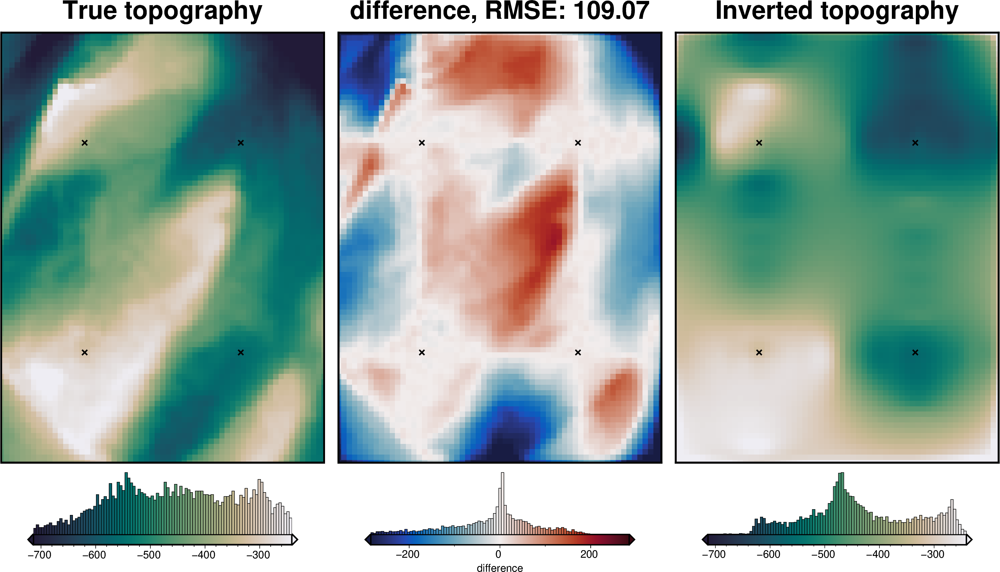

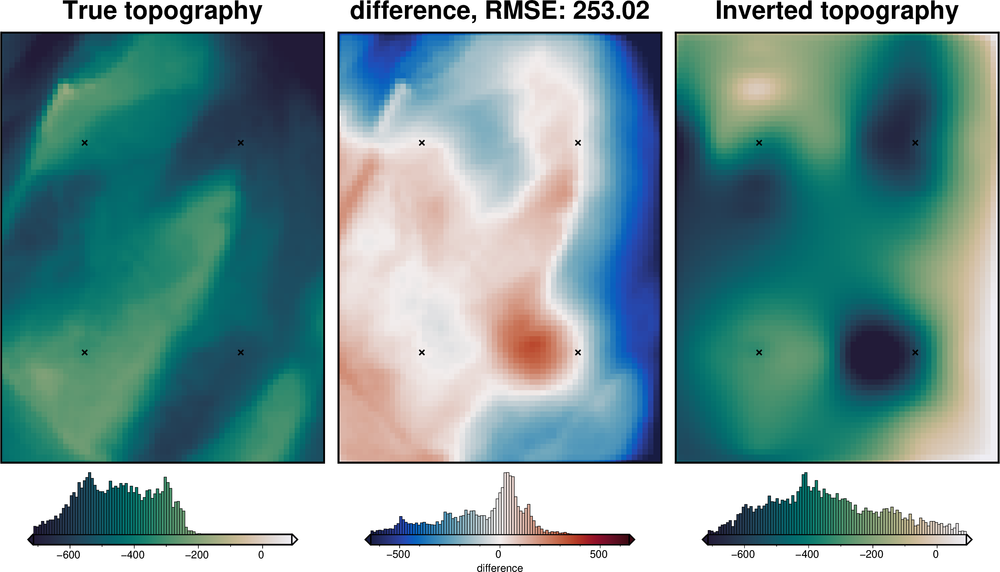

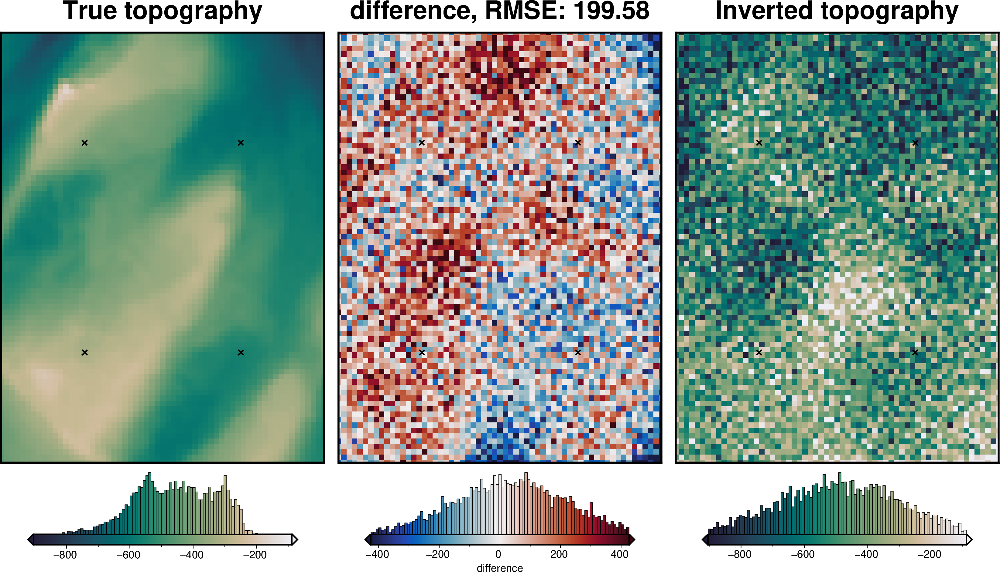

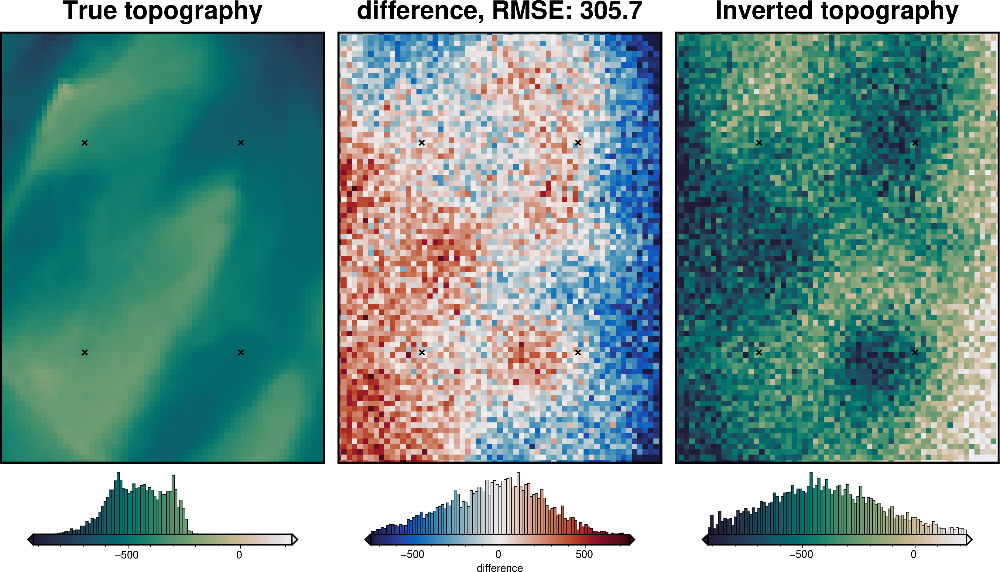

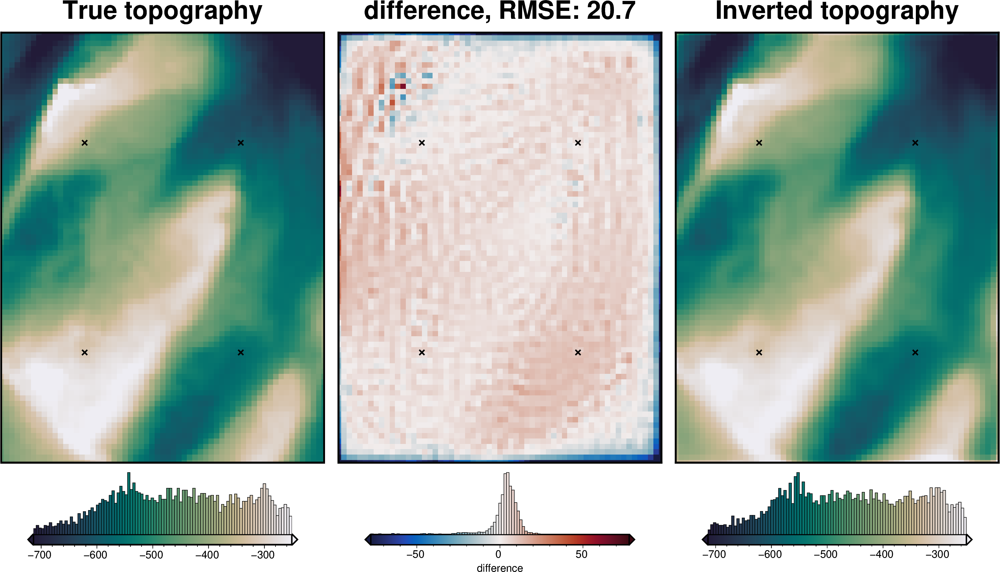

...

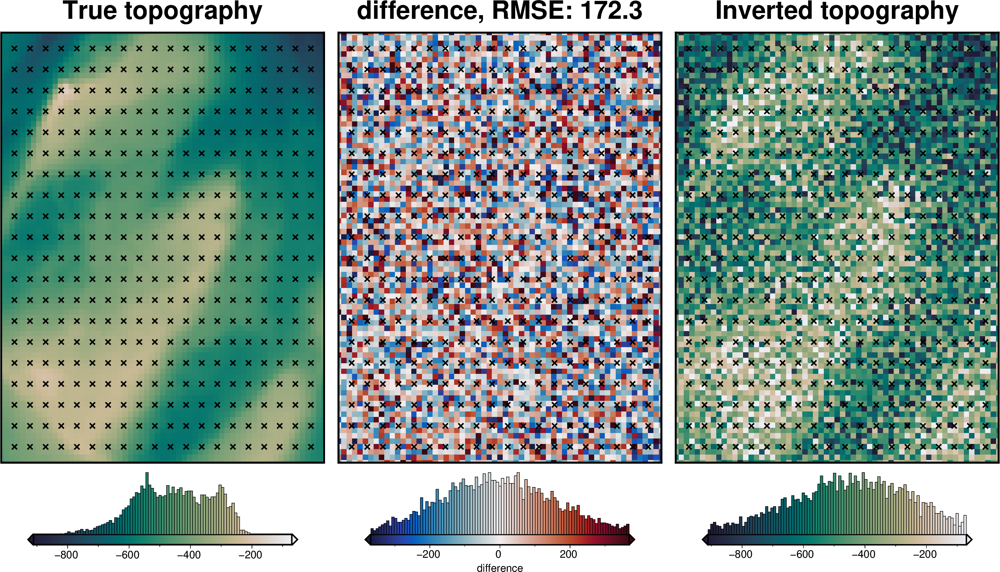

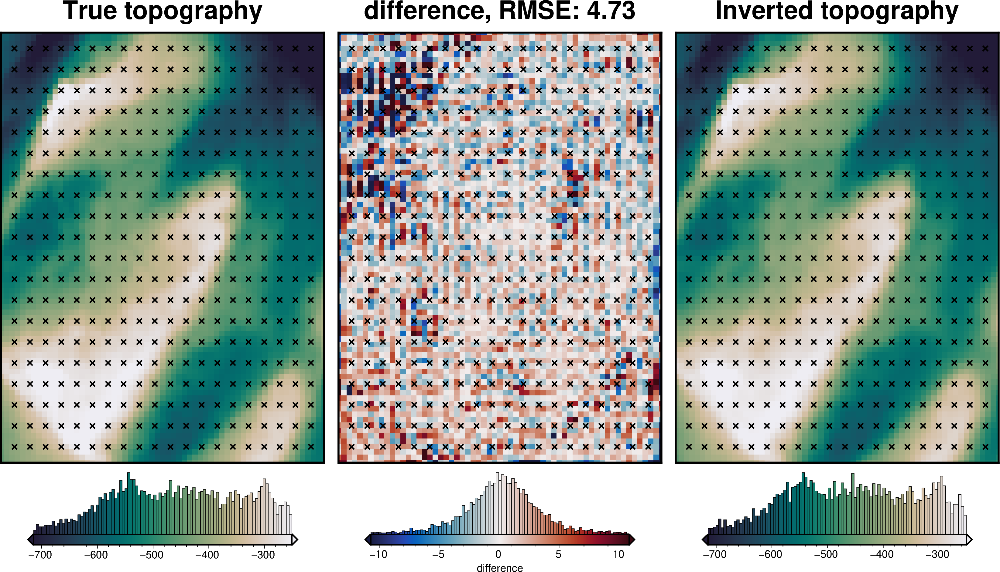

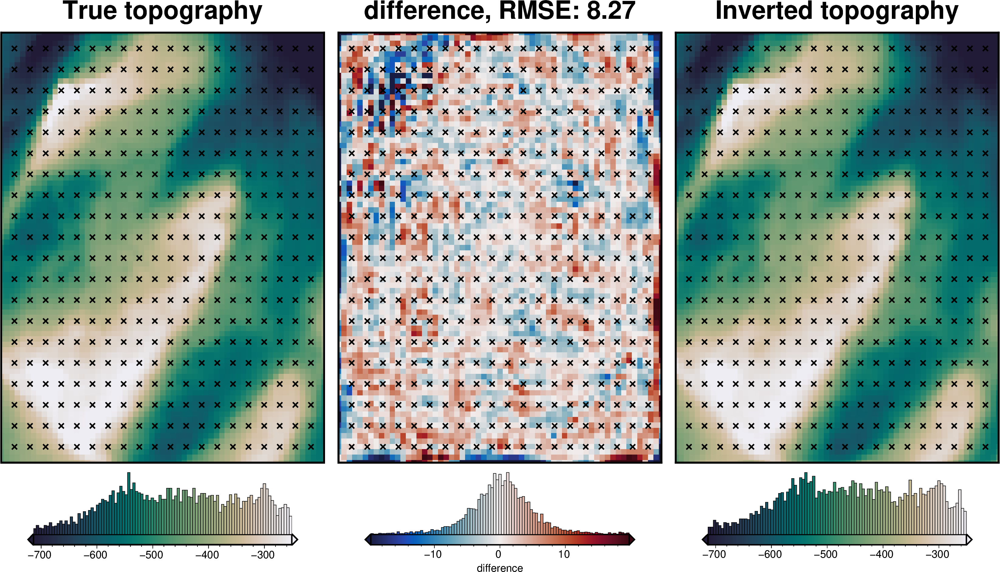

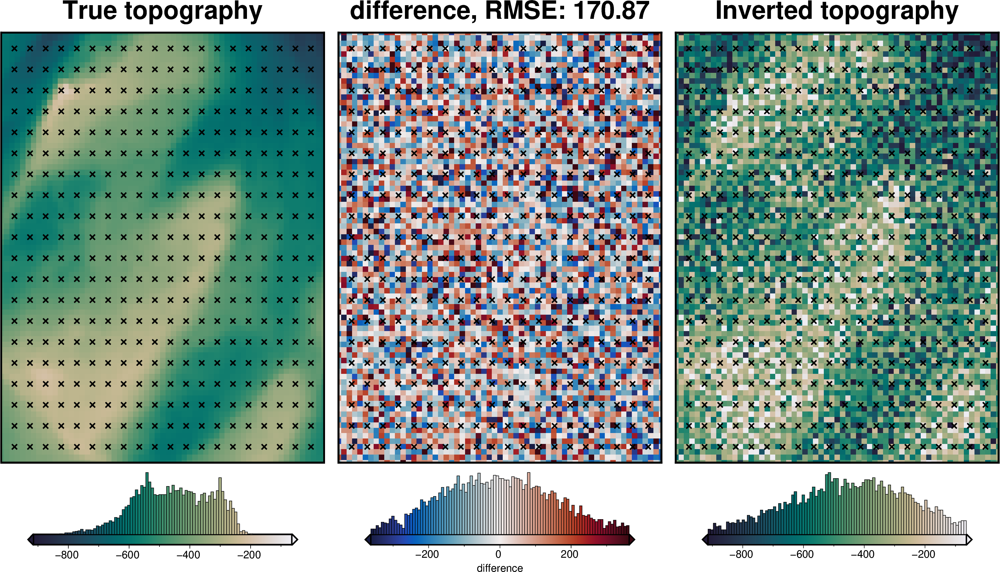

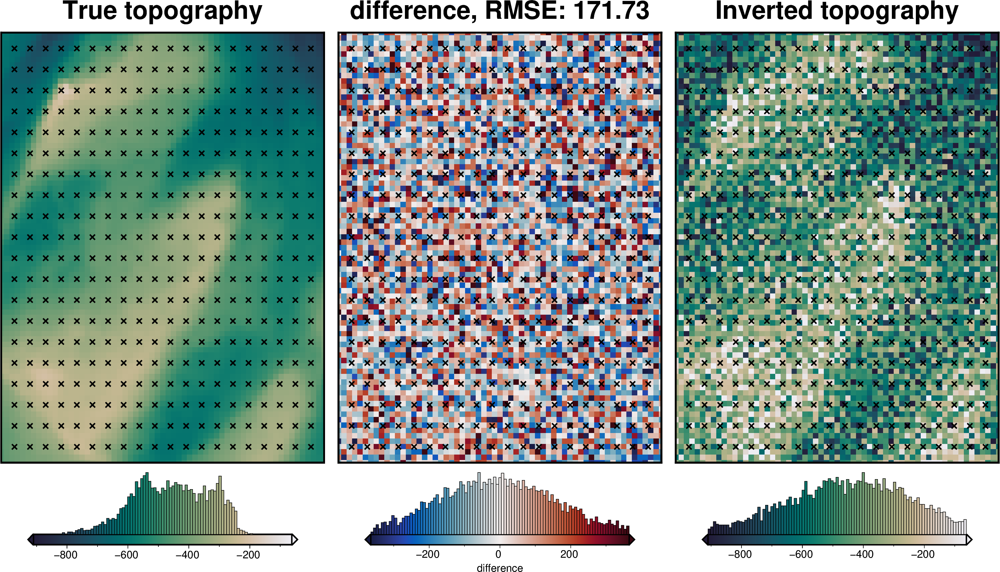

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.58421,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.0,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2,1600.0,54.358327,199.576588,../../results/inverted_density_cv_bathymetry_2.nc
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3,1600.0,49.282799,305.702616,../../results/inverted_density_cv_bathymetry_3.nc
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4,1436.060847,6.078954,20.696522,../../results/inverted_density_cv_bathymetry_4.nc


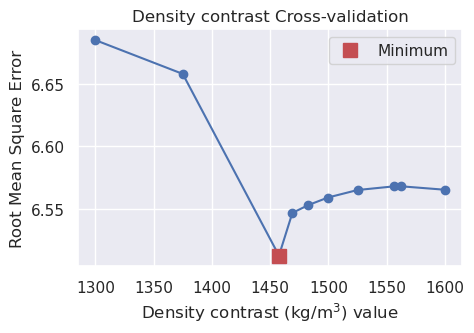

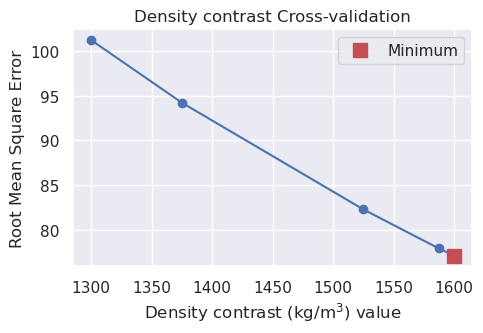

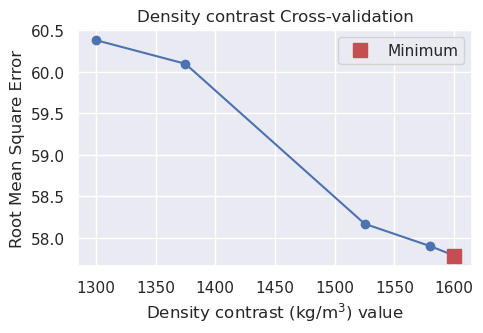

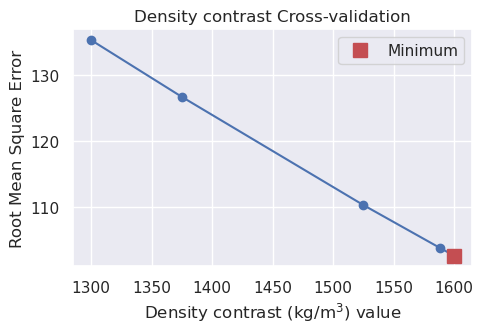

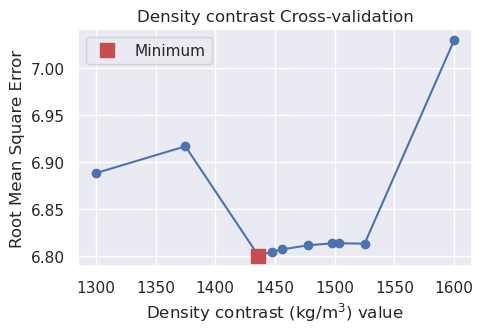

...

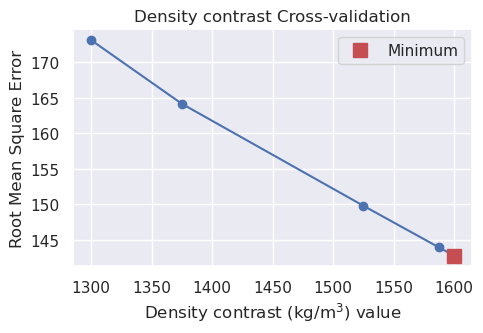

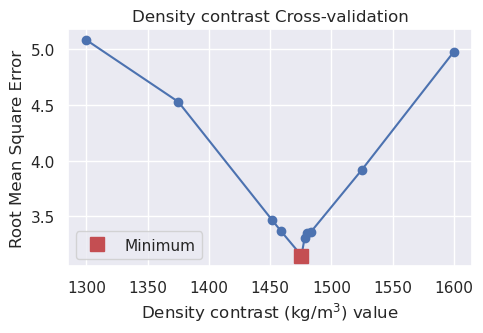

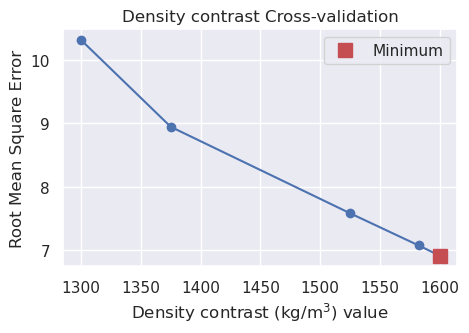

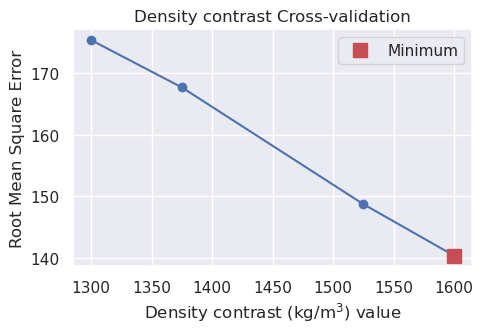

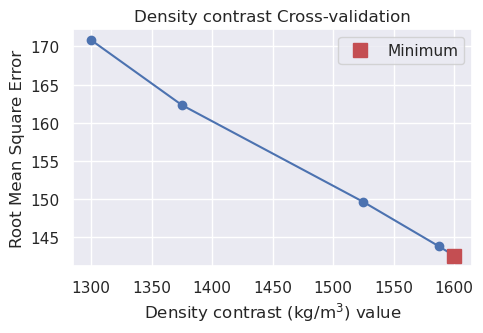

In [45]:
sampled_params_df["best_density"] = pd.Series()
sampled_params_df["constraints_density_cv_rmse"] = pd.Series()
sampled_params_df["inversion_density_cv_rmse"] = pd.Series()

for i, row in sampled_params_df.iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.density_cv_results_fname}_results.pickle").open("rb") as f:
        results = pickle.load(f)

    # load study
    with pathlib.Path(f"{row.density_cv_results_fname}_study.pickle").open("rb") as f:
        study = pickle.load(f)

    # collect the results
    topo_results, grav_results, parameters, elapsed_time = results

    # add best damping to dataframe
    sampled_params_df.loc[i, "best_density"] = study.best_params["density_contrast"]

    # plotting.plot_convergence(
    #     grav_results,
    #     params=parameters,
    # )

    plotting.plot_cv_scores(
            study.trials_dataframe().value.values,
            study.trials_dataframe().params_density_contrast.values,
            param_name="Density contrast (kg/m$^3$)",
            plot_title="Density contrast Cross-validation",
            logx=False,
            logy=False,
        )

    # plotting.plot_inversion_results(
    #     grav_results,
    #     topo_results,
    #     parameters,
    #     inversion_region,
    #     iters_to_plot=2,
    #     # plot_iter_results=False,
    #     plot_topo_results=False,
    #     plot_grav_results=False,
    # )

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    _ = polar_utils.grd_compare(
        bathymetry,
        final_bathymetry,
        region=inversion_region,
        plot=True,
        grid1_name="True topography",
        grid2_name="Inverted topography",
        robust=True,
        hist=True,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        reverse_cpt=True,
        cmap="rain",
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.2c",
    )

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        "inverted_density_cv_bathymetry",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_density_cv_bathymetry)
    bathymetry_inner = bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    final_bathymetry_inner = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    inversion_rmse = utils.rmse(bathymetry_inner - final_bathymetry_inner)

    # save final topography to file
    path = "../../results/"
    inverted_bathymetry_fname = f"{path}inverted_density_cv_bathymetry_{i}.nc"
    final_bathymetry.to_netcdf(inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "inverted_density_cv_bathymetry_fname"] = inverted_bathymetry_fname
    sampled_params_df.loc[i, "constraints_density_cv_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "inversion_density_cv_rmse"] = inversion_rmse

sampled_params_df.head()

In [46]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [47]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.584210,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.000000,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2,1600.000000,54.358327,199.576588,../../results/inverted_density_cv_bathymetry_2.nc
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3,1600.000000,49.282799,305.702616,../../results/inverted_density_cv_bathymetry_3.nc
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4,1436.060847,6.078954,20.696522,../../results/inverted_density_cv_bathymetry_4.nc


In [48]:
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,damping_cv_results_fname,best_damping,constraints_damping_cv_rmse,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_0,0.039599,6.742490,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.584210,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_1,0.074596,11.686968,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.000000,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_2,0.022008,49.851358,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2,1600.000000,54.358327,199.576588,../../results/inverted_density_cv_bathymetry_2.nc
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_3,0.024284,41.721946,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3,1600.000000,49.282799,305.702616,../../results/inverted_density_cv_bathymetry_3.nc
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_4,0.042779,6.355648,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4,1436.060847,6.078954,20.696522,../../results/inverted_density_cv_bathymetry_4.nc
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_5,0.049559,11.124909,304.657228,../../results/inverted_damping_cv_bathymetry_5.nc,../../results/Ross_Sea_08_density_cv_5,1600.000000,10.288034,245.704785,../../results/inverted_density_cv_bathymetry_5.nc
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_6,0.021945,49.990414,219.397104,../../results/inverted_damping_cv_bathymetry_6.nc,../../results/Ross_Sea_08_density_cv_6,1600.000000,54.387611,188.767047,../../results/inverted_density_cv_bathymetry_6.nc
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,...,../../results/Ross_Sea_08_damping_cv_7,0.023002,46.726268,386.655443,../../results/inverted_damping_cv_bathymetry_7.nc,../../results/Ross_Sea_08_density_cv_7,1600.000000,52.630598,300.935322,../../results/inverted_density_cv_bathymetry_7.nc
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,...,../../results/Ross_Sea_08_damping_cv_8,0.020108,17.602864,36.393509,../../results/inverted_damping_cv_bathymetry_8.nc,../../results/Ross_Sea_08_density_cv_8,1580.060277,17.061660,36.698093,../../results/inverted_density_cv_bathymetry_8.nc
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,...,../../results/Ross_Sea_08_damping_cv_9,0.022124,2.587267,16.194007,../../results/inverted_damping_cv_bathymetry_9.nc,../../results/Ross_Sea_08_density_cv_9,1600.

In [49]:
sampled_params_df["regional_error"] = pd.Series()
sampled_params_df["regional_rms"] = pd.Series()

for i, row in sampled_params_df.iterrows():
    grav_df = pd.read_csv(row.grav_df_fname)

    sampled_params_df.loc[i, "regional_error"] = utils.rmse(grav_df.basement_grav - grav_df.reg)
    sampled_params_df.loc[i, "regional_rms"] = utils.rmse(grav_df.reg)

sampled_params_df["topo_improvement"] = sampled_params_df.starting_bathymetry_rmse - sampled_params_df.inversion_density_cv_rmse

sampled_params_df#.head()

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname,regional_error,regional_rms,topo_improvement
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.584210,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc,2.178537,2.178537,267.392071
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.000000,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc,17.005782,20.000208,123.446411
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2,1600.000000,54.358327,199.576588,../../results/inverted_density_cv_bathymetry_2.nc,5.121643,5.121643,176.890267
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3,1600.000000,49.282799,305.702616,../../results/inverted_density_cv_bathymetry_3.nc,18.761874,22.390023,70.764239
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4,1436.060847,6.078954,20.696522,../../results/inverted_density_cv_bathymetry_4.nc,2.144012,2.144012,355.770333
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,...,304.657228,../../results/inverted_damping_cv_bathymetry_5.nc,../../results/Ross_Sea_08_density_cv_5,1600.000000,10.288034,245.704785,../../results/inverted_density_cv_bathymetry_5.nc,16.952651,19.934895,130.762070
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,...,219.397104,../../results/inverted_damping_cv_bathymetry_6.nc,../../results/Ross_Sea_08_density_cv_6,1600.000000,54.387611,188.767047,../../results/inverted_density_cv_bathymetry_6.nc,5.108792,5.108792,187.699808
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,...,386.655443,../../results/inverted_damping_cv_bathymetry_7.nc,../../results/Ross_Sea_08_density_cv_7,1600.000000,52.630598,300.935322,../../results/inverted_density_cv_bathymetry_7.nc,18.704854,22.32395,75.531533
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,...,36.393509,../../results/inverted_damping_cv_bathymetry_8.nc,../../results/Ross_Sea_08_density_cv_8,1580.060277,17.061660,36.698093,../../results/inverted_density_cv_bathymetry_8.nc,5.259352,5.259352,9.769341
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,...,16.194007,../../results/inverted_damping_cv_bathymetry_9.nc,../../results/Ross_Sea_08_density_cv_9,1600.000000,11.530562,17.235689,../../results/inverted_density_cv_bathymetry_9.nc,6.748806,13.313557,29.231746


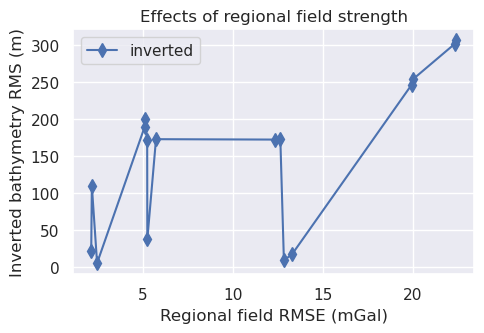

In [50]:
RIS_plotting.plot_1var_ensemble(
    df=sampled_params_df[sampled_params_df],
    x="regional_rms",
    y="inversion_density_cv_rmse",
    title="Effects of regional field strength",
    xlabel="Regional field RMSE (mGal)",
    ylabel="Inverted bathymetry RMS (m)",
    # horizontal_line=starting_rmse,
    # horizontal_line_label="Starting RMSE",
    # plot_starting_error=True,
)

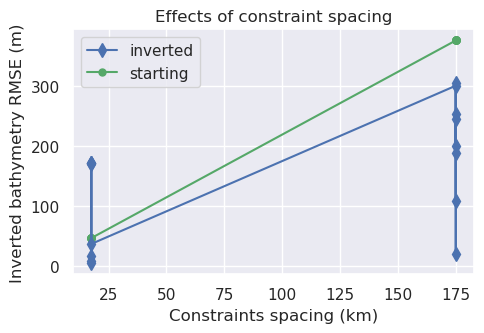

In [51]:
RIS_plotting.plot_1var_ensemble(
    df=sampled_params_df,
    x="constraint_spacing",
    y="inversion_density_cv_rmse",
    title="Effects of constraint spacing",
    xlabel="Constraints spacing (km)",
    ylabel="Inverted bathymetry RMSE (m)",
    # horizontal_line=starting_rmse,
    # horizontal_line_label="Starting RMSE",
    starting_error="starting_bathymetry_rmse",
    # logx=True,
)

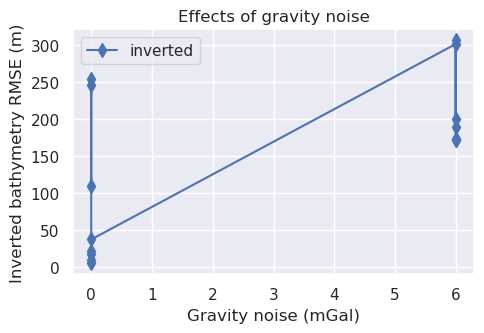

In [52]:
RIS_plotting.plot_1var_ensemble(
    df=sampled_params_df,
    x="grav_noise_levels",
    y="inversion_density_cv_rmse",
    title="Effects of gravity noise",
    xlabel="Gravity noise (mGal)",
    ylabel="Inverted bathymetry RMSE (m)",
    # horizontal_line=starting_rmse,
    # horizontal_line_label="Starting RMSE",
)

In [56]:
sampled_params_df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname,regional_error,regional_rms,topo_improvement
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.584210,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc,2.178537,2.178537,267.392071
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.000000,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc,17.005782,20.000208,123.446411
2,2,0,2,6,0,../../results/constraint_points_2.csv,0.006959,../../results/starting_bathymetry_2.nc,376.466855,175.0,...,227.623778,../../results/inverted_damping_cv_bathymetry_2.nc,../../results/Ross_Sea_08_density_cv_2,1600.000000,54.358327,199.576588,../../results/inverted_density_cv_bathymetry_2.nc,5.121643,5.121643,176.890267
3,2,0,2,6,50,../../results/constraint_points_3.csv,0.006959,../../results/starting_bathymetry_3.nc,376.466855,175.0,...,383.045265,../../results/inverted_damping_cv_bathymetry_3.nc,../../results/Ross_Sea_08_density_cv_3,1600.000000,49.282799,305.702616,../../results/inverted_density_cv_bathymetry_3.nc,18.761874,22.390023,70.764239
4,2,0,30,0,0,../../results/constraint_points_4.csv,0.006959,../../results/starting_bathymetry_4.nc,376.466855,175.0,...,24.115828,../../results/inverted_damping_cv_bathymetry_4.nc,../../results/Ross_Sea_08_density_cv_4,1436.060847,6.078954,20.696522,../../results/inverted_density_cv_bathymetry_4.nc,2.144012,2.144012,355.770333
5,2,0,30,0,50,../../results/constraint_points_5.csv,0.006959,../../results/starting_bathymetry_5.nc,376.466855,175.0,...,304.657228,../../results/inverted_damping_cv_bathymetry_5.nc,../../results/Ross_Sea_08_density_cv_5,1600.000000,10.288034,245.704785,../../results/inverted_density_cv_bathymetry_5.nc,16.952651,19.934895,130.762070
6,2,0,30,6,0,../../results/constraint_points_6.csv,0.006959,../../results/starting_bathymetry_6.nc,376.466855,175.0,...,219.397104,../../results/inverted_damping_cv_bathymetry_6.nc,../../results/Ross_Sea_08_density_cv_6,1600.000000,54.387611,188.767047,../../results/inverted_density_cv_bathymetry_6.nc,5.108792,5.108792,187.699808
7,2,0,30,6,50,../../results/constraint_points_7.csv,0.006959,../../results/starting_bathymetry_7.nc,376.466855,175.0,...,386.655443,../../results/inverted_damping_cv_bathymetry_7.nc,../../results/Ross_Sea_08_density_cv_7,1600.000000,52.630598,300.935322,../../results/inverted_density_cv_bathymetry_7.nc,18.704854,22.32395,75.531533
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,...,36.393509,../../results/inverted_damping_cv_bathymetry_8.nc,../../results/Ross_Sea_08_density_cv_8,1580.060277,17.061660,36.698093,../../results/inverted_density_cv_bathymetry_8.nc,5.259352,5.259352,9.769341
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,...,16.194007,../../results/inverted_damping_cv_bathymetry_9.nc,../../results/Ross_Sea_08_density_cv_9,1600.000000,11.530562,17.235689,../../results/inverted_density_cv_bathymetry_9.nc,6.748806,13.313557,29.231746


In [59]:
df = sampled_params_df[
    (sampled_params_df.constraint_noise_levels==0) & (sampled_params_df.grav_noise_levels==0) & (sampled_params_df.grav_line_numbers==2)
]
df

,constraint_numbers,constraint_noise_levels,grav_line_numbers,grav_noise_levels,regional_strengths,constraint_points_fname,constraints_starting_rmse,starting_bathymetry_fname,starting_bathymetry_rmse,constraint_spacing,...,inversion_damping_cv_rmse,inverted_damping_cv_bathymetry_fname,density_cv_results_fname,best_density,constraints_density_cv_rmse,inversion_density_cv_rmse,inverted_density_cv_bathymetry_fname,regional_error,regional_rms,topo_improvement
0,2,0,2,0,0,../../results/constraint_points_0.csv,0.006959,../../results/starting_bathymetry_0.nc,376.466855,175.0,...,110.454482,../../results/inverted_damping_cv_bathymetry_0.nc,../../results/Ross_Sea_08_density_cv_0,1457.584210,5.757151,109.074784,../../results/inverted_density_cv_bathymetry_0.nc,2.178537,2.178537,267.392071
1,2,0,2,0,50,../../results/constraint_points_1.csv,0.006959,../../results/starting_bathymetry_1.nc,376.466855,175.0,...,306.908011,../../results/inverted_damping_cv_bathymetry_1.nc,../../results/Ross_Sea_08_density_cv_1,1600.000000,10.646039,253.020444,../../results/inverted_density_cv_bathymetry_1.nc,17.005782,20.000208,123.446411
8,20,0,2,0,0,../../results/constraint_points_8.csv,2.005857,../../results/starting_bathymetry_8.nc,46.467434,17.5,...,36.393509,../../results/inverted_damping_cv_bathymetry_8.nc,../../results/Ross_Sea_08_density_cv_8,1580.060277,17.061660,36.698093,../../results/inverted_density_cv_bathymetry_8.nc,5.259352,5.259352,9.769341
9,20,0,2,0,50,../../results/constraint_points_9.csv,2.005857,../../results/starting_bathymetry_9.nc,46.467434,17.5,...,16.194007,../../results/inverted_damping_cv_bathymetry_9.nc,../../results/Ross_Sea_08_density_cv_9,1600.000000,11.530562,17.235689,../../results/inverted_density_cv_bathymetry_9.nc,6.748806,13.313557,29.231746


Text(0.6, -0.0, 'few constraints')

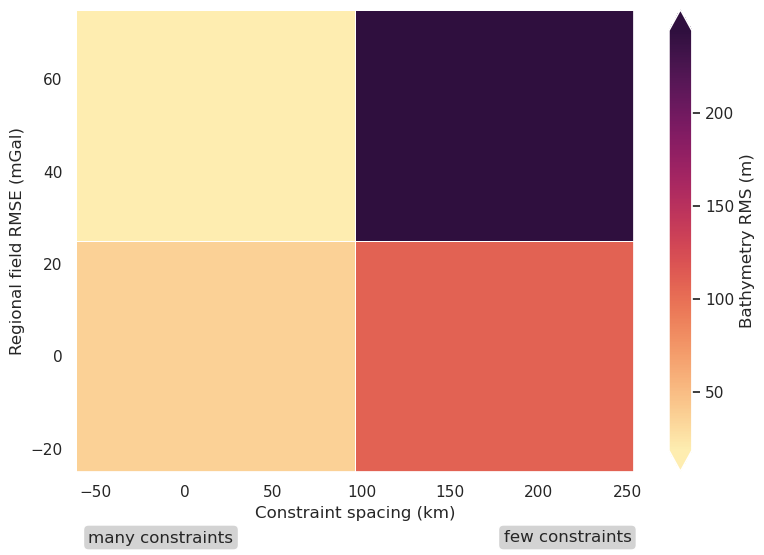

In [60]:
fig = RIS_plotting.plot_2var_ensemble(
    df,
    x="constraint_spacing",
    y="regional_strengths",
    x_title="Constraint spacing (km)",
    y_title="Regional field RMSE (mGal)",
    background="inversion_density_cv_rmse",
    background_title="Bathymetry RMS (m)",
    background_robust=True,
)
bbox = dict(facecolor='lightgray', boxstyle="round")
plt.gcf().text(0.3, -.0, "many constraints", fontsize=12, va="center", ha="right", bbox=bbox)
plt.gcf().text(0.6, -.0, "few constraints", fontsize=12, va="center", ha="left", bbox=bbox)

In [ ]:
fig = RIS_plotting.plot_2var_ensemble(
    df,
    x="constraint_spacing",
    y="regional_strengths",
    x_title="Constraint spacing (km)",
    y_title="Regional field RMS (mGal)",
    background="topo_improvement",
    background_title="Topo improvement (m)",
    background_robust=True,
    background_lims=(0, df.topo_improvement.max()),
)
bbox = dict(facecolor='lightgray', boxstyle="round")
plt.gcf().text(0.3, -.0, "many constraints", fontsize=12, va="center", ha="right", bbox=bbox)
plt.gcf().text(0.6, -.0, "few constraints", fontsize=12, va="center", ha="left", bbox=bbox)


In [ ]:
RIS_plotting.plot_ensemble_as_lines(
    df,
    y="inversion_density_cv_rmse",
    x="constraint_spacing",
    groupby_col="regional_strengths",
    x_label="constraint spacing (km)",
    cbar_label="Regional field RMS (mGal)",
    trend_line=True,
)

In [ ]:
RIS_plotting.plot_ensemble_as_lines(
    df,
    y="topo_improvement",
    x="constraint_spacing",
    groupby_col="regional_strengths",
    x_label="constraint spacing (km)",
    y_label="Topo improvement (m)",
    cbar_label="Regional field RMS (mGal)",
    trend_line=True,
    horizontal_line=0,
)

In [ ]:
RIS_plotting.plot_ensemble_as_lines(
    df,
    y="inversion_density_cv_rmse",
    x="regional_strengths",
    groupby_col="constraint_spacing",
    x_label="Regional field RMS (mGal)",
    cbar_label="constraint spacing (km)",
    trend_line=True,
)

In [ ]:
RIS_plotting.plot_ensemble_as_lines(
    df,
    y="topo_improvement",
    x="regional_strengths",
    groupby_col="constraint_spacing",
    x_label="Regional field RMS (mGal)",
    y_label="Topo improvement (m)",
    cbar_label="constraint spacing (km)",
    trend_line=True,
    horizontal_line=0,
)

In [ ]:
df.regional_strengths.unique()

In [ ]:
df1 = df[df.regional_strengths==50]

RIS_plotting.plot_1var_ensemble(
    df1,
    x="constraint_spacing",
    y="inversion_density_cv_rmse",
    title="Effects of constraint spacing",
    xlabel="Constraints spacing (km)",
    ylabel="Inverted bathymetry RMSE (m)",
    # horizontal_line=starting_rmse,
    # horizontal_line_label="Starting RMSE",
    starting_error="starting_bathymetry_rmse",
    # logx=True,
)

In [ ]:
fig = RIS_plotting.plot_2var_ensemble(
    df,
    x="noise",
    y="line_spacing_km",
    x_title="Gravity noise (mGal)",
    y_title="Line spacing (km)",
    background="rmse",
    background_title="Bathymetry RMSE (m)",
    background_robust=True,
    plot_contours=[starting_rmse],
)